In [156]:
### Make sure you change everything here then run this code. 
# change your detection threshold here
detection_thresh = (0.4,0.3)
# If the image is normalized (i.e normalized from CSBdeep or other method, use True, or use False)
normalized = False
# Change your normalize threshold here. If it is True previously, you dont need to change it. 
normalize_thresh = (0.1, 99.9)
# Run all then you are good.
# Do you want to use a custo trained model here. 
custom_model = True


In [ ]:
# Takes a while to load all when you started 
from __future__ import print_function, unicode_literals, absolute_import, division
# Here import important system functions 
import os
import sys
# import tk for getting the directory faster. dont need this in a command line/server version
import tkinter as tk
from tkinter import filedialog
# you need numpy as always
import numpy as np
import csv
import random
import math
# if you dont need to plot in jupyter you don need these. Some magic interperters need to be removed for command line version. 
import matplotlib
matplotlib.rcParams["image.interpolation"] = 'none'
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
# Glob and tifffile are needed
from glob import glob
from tifffile import imread,imwrite
# csb deep is to take normalization 
from csbdeep.utils import Path, normalize
from csbdeep.io import save_tiff_imagej_compatible
# This is your stardist models and everything in stardist coming from. 
from stardist import random_label_cmap, _draw_polygons, export_imagej_rois
from stardist.models import StarDist2D
# Set random seed for you color map. You do not really need this to be 6 all the time, but its okay. 
np.random.seed(6)
lbl_cmap = random_label_cmap()

In [134]:
# Use Tkinter to find your file path. 
def open_file_dialog():
    root = tk.Tk()
    root.withdraw()  # Hide the main window

    file_path = filedialog.askdirectory()  # Open the file dialog window
    os.chdir(file_path)
    root.destroy()  # Destroy the root window after file selection
    return file_path

if __name__ == "__main__":
    selected_file_path = open_file_dialog()
    print("Selected file path:", selected_file_path)


Selected file path: /Users/eliasguan/Desktop/EG_stardist_segmentation/022523_smFISH_analysis_v2.0_development/Weekly_Reports/2024Spring/050724/Self_trained_model_test/Sequence


In [2]:
def create_directory(dir_name):
    '''input: Dir_name: The name of the directory, string, default results 
       output: Wether the directory is created or it already exists 
    '''
    current_directory = os.getcwd()  # Get the current working directory
    results_directory = os.path.join(current_directory, str(dir_name))  # Path to the results directory
    
    if not os.path.exists(results_directory):  # Check if the results directory exists
        os.mkdir(dir_name)  # Create the results directory if it doesn't exist
        print("Target directory "+dir_name+" created successfully.")
    else:
        print("Target directory already exists.")

In [3]:
def prepare_for_analysis(dirname = '.'):
    '''input: dirname, default is current folder
       Creates folder needed for data analysis
       Output: None
    '''
    path = os.getcwd()
    os.chdir('..')
    create_directory('labels')
    create_directory('polygons')
    create_directory('rois')
    create_directory('random_examples')
    os.chdir(path)

In [4]:
def make_stardist_Predictions_labels (dataset, normalized = False, normalize_low = 0, normalize_high = 0, nms_thresh = 0, prob_thresh = 0): 
    ''' input: csbdeep input: If this image is a csbdeep filtered image. If this is true, the image will not be normalized. 
               dataset: The data set you want to analysis on 
               normalize_low and normalized_high: The parameter you want to normalize, if either of them is 0 will use default value (1,99.8)
               if not then will use these values 
               nms_thresh and prob_thrsh : the parameter of overlapping and probablity threshold. If eitehr of them is 0 will use default value 
               for the model (depend on the model) if not then use these values
    '''
    labels_collection= []
    for i in range(len(dataset)): 
        if not normalized:
            if normalize_low ==0 or normalize_high == 0:
                img = normalize(dataset[i], 1,99.8, axis=(0,1))
            else:
                img = normalize(dataset[i], normalize_low, normalize_high, axis=(0,1))
        else:
            img = dataset[i]
        if nms_thresh == 0 or prob_thresh == 0 :
            labels, details = model.predict_instances(img)
        else: 
            labels, details = model.predict_instances(img,nms_thresh = nms_thresh, prob_thresh = prob_thresh)
        # write labels
        labels_collection.append(labels)
        export_imagej_rois('polygons/polygon_rois_'+str(i).zfill(3)+'.zip', details['coord'])
    labels_collection = np.array(labels_collection, dtype = np.uint8)
    imwrite("labels/Nucleus_Labels",labels_collection )
    return labels_collection
        

In [6]:
def random_select_images(dataset, percentage):
    """
    Randomly select a certain percentage of images from the dataset.

    Parameters:
        dataset (list): A list containing 2D arrays (images).
        percentage (float): Percentage of images to be selected.

    Returns:
        selected_indices (list): A list of indices corresponding to the selected images.
    """
    num_images = len(dataset)
    num_selected = int(np.ceil(percentage/100 * num_images))
    selected_indices = np.random.choice(num_images, num_selected, replace=False)
    return selected_indices

def random_select_region(image, region_size):
    """
    Randomly select a region within the image with a certain size.

    Parameters:
        image (2D array): The original image.
        region_size (tuple): The size of the region to be selected (height, width).

    Returns:
        region (2D array): The selected region.
    """
    image_height, image_width = image.shape
    region_height, region_width = region_size

    if region_height > image_height or region_width > image_width:
        raise ValueError("Region size exceeds original image size.")

    start_row = np.random.randint(0, image_height - region_height + 1)
    start_col = np.random.randint(0, image_width - region_width + 1)
    end_row = start_row + region_height
    end_col = start_col + region_width

    region_prop = [(start_row, end_row),(start_col,end_col)]
    return region_prop

In [149]:
# Set parameter: 
def make_stardist_Predictions (dataset, normalize_low = 0, normalize_high = 0, nms_thresh = 0, prob_thresh = 0, normalized = False, dpi = 50): 
    path = os.getcwd()
    os.chdir('..')
    for i in range(len(dataset)): 
        if normalized:
            img = dataset[i]
        else:    
            if normalize_low ==0 or normalize_high == 0:
                img = normalize(dataset[i], 1,99.8, axis=(0,1))
            else:
                img = normalize(dataset[i], normalize_low, normalize_high, axis=(0,1))    
        if nms_thresh == 0 or prob_thresh == 0 :
            labels, details = model.predict_instances(img)
        else: 
            labels, details = model.predict_instances(img,nms_thresh = nms_thresh, prob_thresh = prob_thresh)
        # write labels
        imwrite("labels/Nucleus_Labels_"+str(i).zfill(3)+".tif", labels)
        export_imagej_rois('rois/polygon_rois_'+str(0).zfill(3)+'.zip', details['coord'])
        coord, points, prob = details['coord'], details['points'], details['prob']
        figure = plt.figure(figsize=[img.shape[0]/dpi,img.shape[1]/dpi])
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        plt.tight_layout()
        frameon = False
        _draw_polygons(coord, points, prob, show_dist=True)
        plt.savefig('polygons/polygon_rois_'+str(i).zfill(3)+'.tif', dpi=dpi)
        plt.close('all')
    os.chdir(path)

In [150]:
def make_random_examples(dataset, normalize_low = 0, nomralize_high =0, nms_thresh =0, prob_thresh = 0, normalized = False, percentage = 20, region_size = (500,500)):
    selected_indicies = sorted(random_select_images(dataset, percentage))
    path = os.getcwd()
    os.chdir('..')
    for item in selected_indicies: 
        if normalized:
            img = dataset[item]
        else:
            if normalize_low ==0 or normalize_high == 0:
                img = normalize(dataset[item], 1,99.8, axis=(0,1))
            else:
                img = normalize(dataset[item], normalize_low, normalize_high, axis=(0,1))   
        if nms_thresh == 0 or prob_thresh == 0 :
            labels, details = model.predict_instances(img)
        else: 
            labels, details = model.predict_instances(img, nms_thresh = nms_thresh, prob_thresh = prob_thresh)
        region_props =  random_select_region(img, region_size)
        cropped_image = img[region_props[0][0]:region_props[0][1],region_props[1][0]:region_props[1][1]]
        cropped_label = labels[region_props[0][0]:region_props[0][1],region_props[1][0]:region_props[1][1]]
        figure = plt.figure(figsize=(13,10))
        coord, points, prob = details['coord'], details['points'], details['prob']
        # Plot image on the first one
        ax1 = figure.add_subplot(121); ax1.imshow(cropped_image, cmap='gray'); ax1.axis('off')
        # Plot image on the second one
        ax2 = figure.add_subplot(122); ax2.imshow(cropped_image, cmap='gray'); ax2.axis('off')
        # Plot labels on the third one. 
        ax2.imshow(cropped_label, cmap=lbl_cmap, alpha=0.3)
        figure.tight_layout()
        plt.savefig("random_examples/random_example_"+str(item).zfill(3)+".tif")
    os.chdir(path)

In [153]:
X = sorted(glob('*.tif'))
# This is a great way to read all images. map(imread, X) equals to for item in X: imread(item), and list makes a list for all of them. 
dataset = list(map(imread,X))

In [158]:
model = StarDist2D(None, name='stardist', basedir='/Users/eliasguan/Desktop/EG_stardist_segmentation/022523_smFISH_analysis_v2.0_development/Weekly_Reports/2024Spring/050724/models')
prepare_for_analysis()
make_stardist_Predictions (dataset, nms_thresh = detection_thresh[0],prob_thresh = detection_thresh[1], normalized = normalized)

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.492714, nms_thresh=0.3.
Target directory already exists.
Target directory already exists.
Target directory already exists.
Target directory already exists.


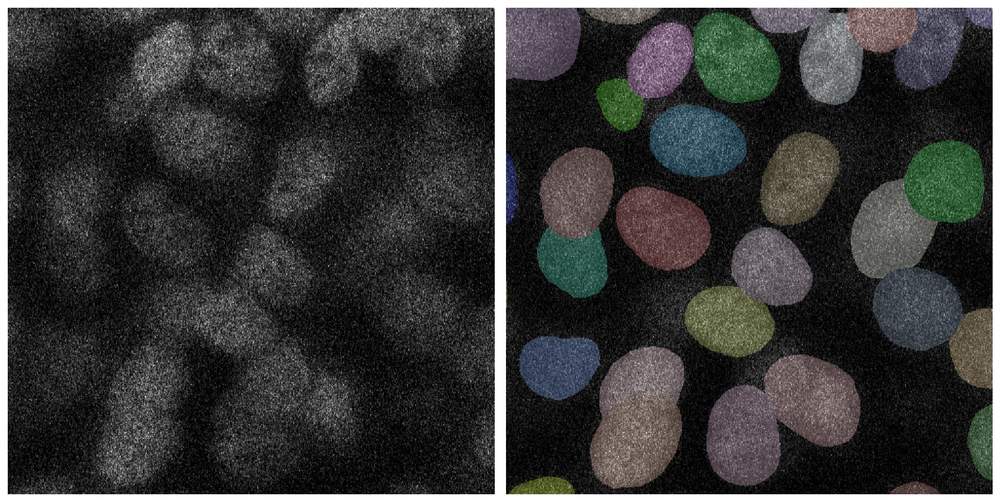

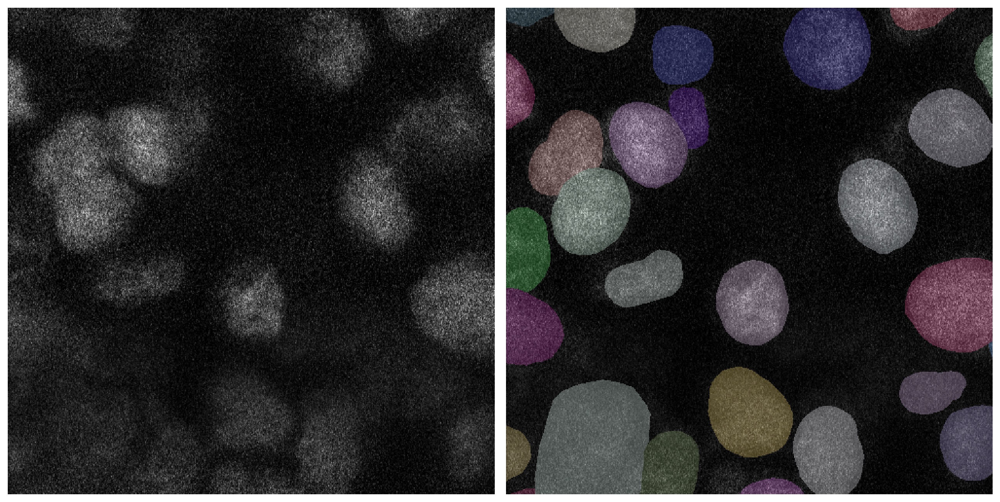

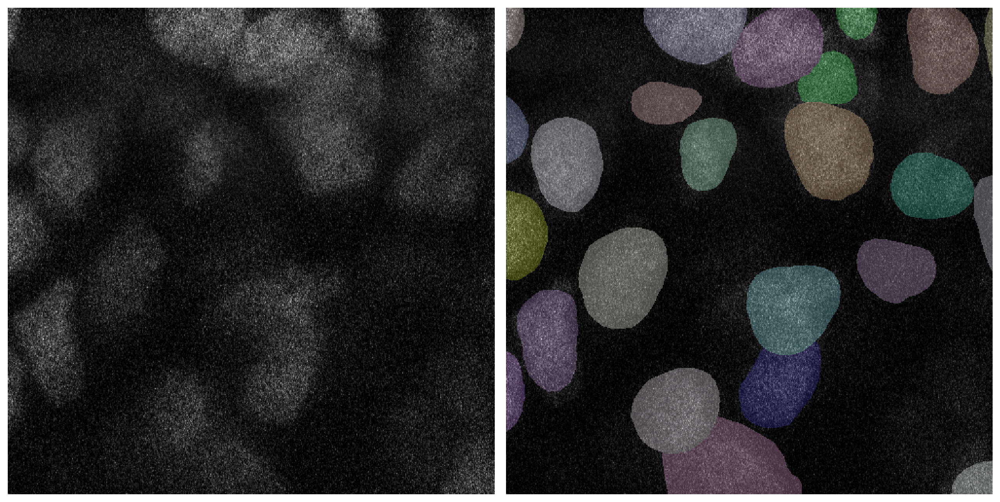

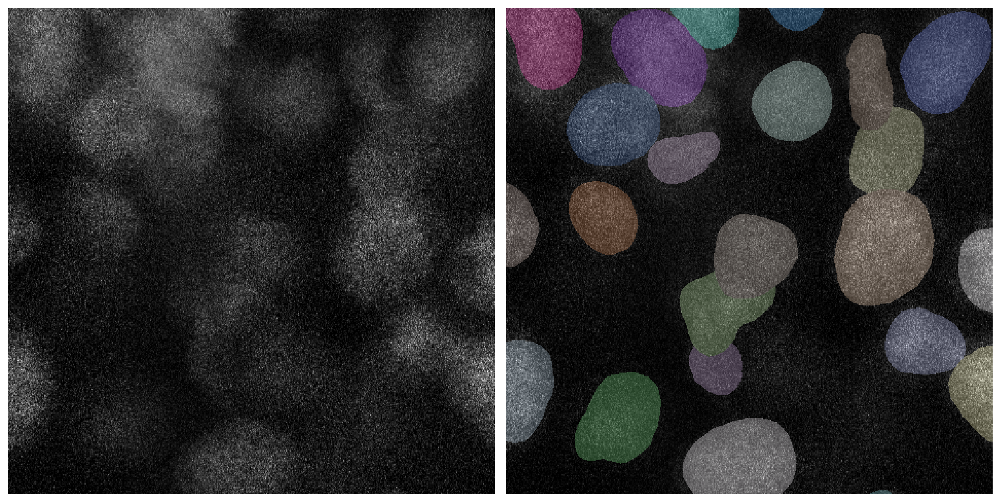

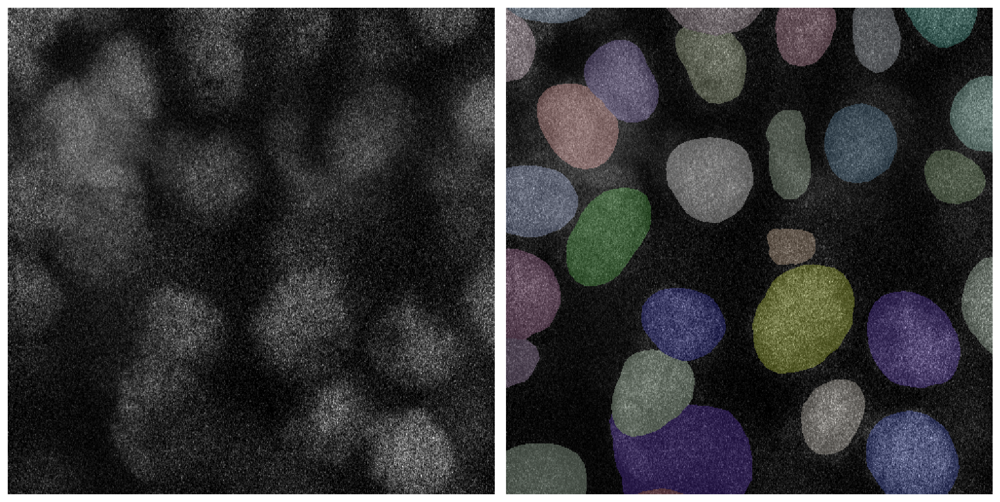

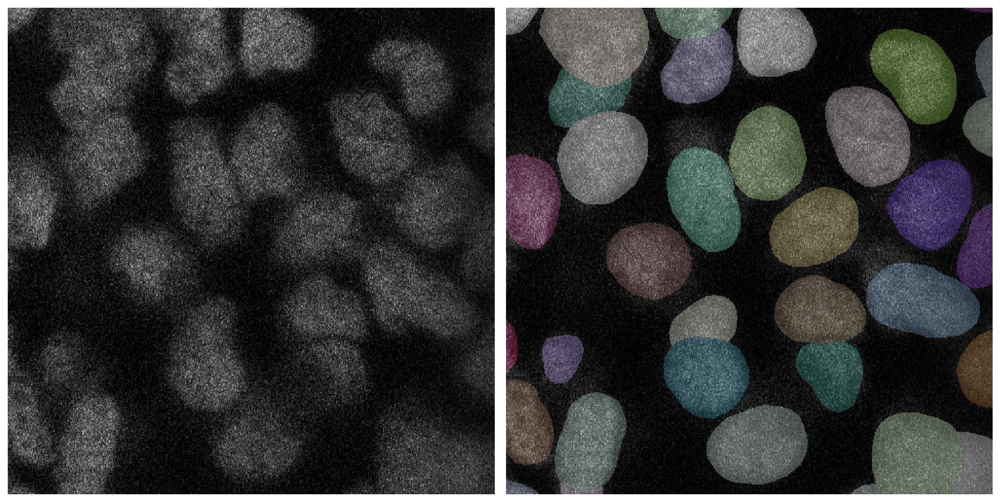

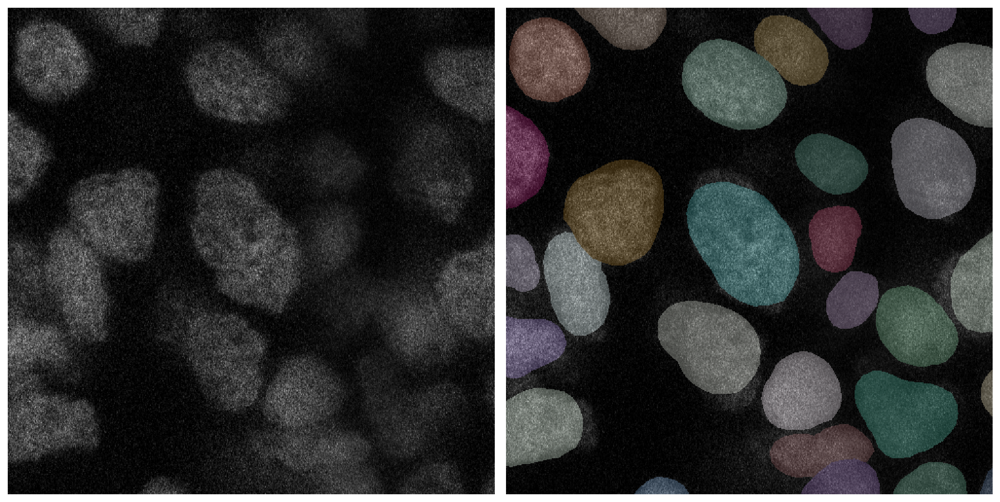

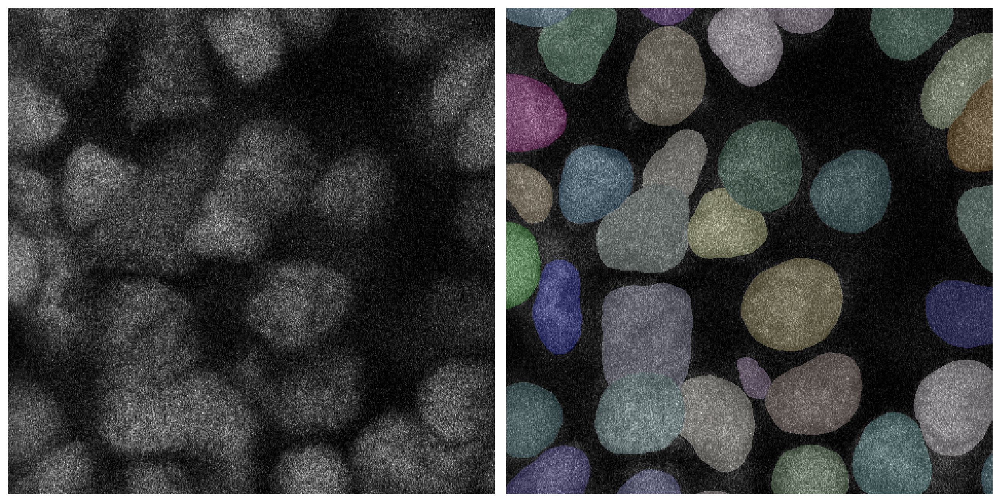

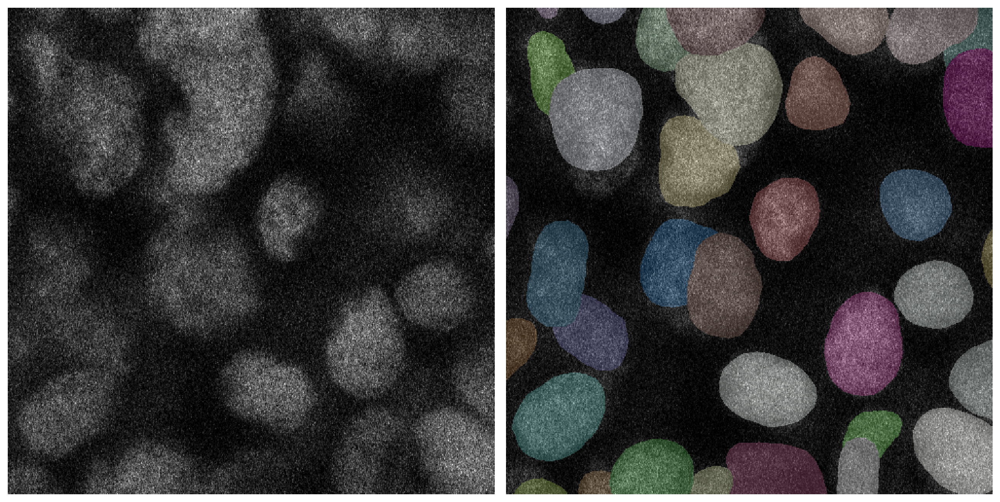

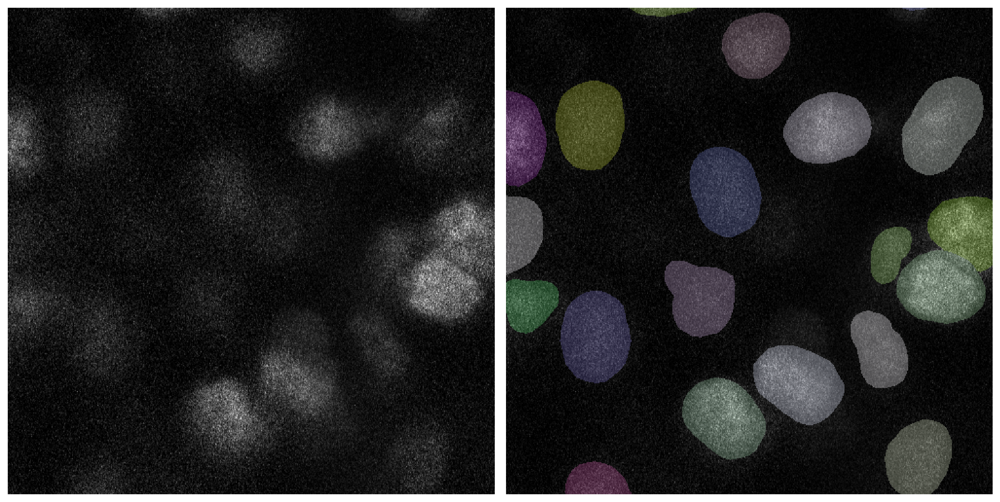

In [159]:
make_random_examples(dataset, nms_thresh = detection_thresh[0], prob_thresh = detection_thresh[1], normalized = normalized)